In [ ]:
import igraph as ig

In [3]:
import preprocessing as prep
import networkx as nx
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt

from collections import Counter
from bb_binary import load_frame_container, Repository
from pandas import Series, DataFrame
%matplotlib inline

In [79]:
g = ig.Graph.Read_GraphML("params2/params2_0.95conf_140dist_9ilen_cam0.graphml")

NameError: name 'ig' is not defined

In [28]:
g

In [29]:
g.summary()

'IGRAPH U-W- 2461 325975 -- \n+ attr: id (v), weight (e)'

In [30]:
l = list(g.es.select(weight_le = 3))

In [31]:
l = [elem.index for elem in l]

In [32]:
g.delete_edges(l)

In [33]:
g.summary()

'IGRAPH U-W- 2461 35548 -- \n+ attr: id (v), weight (e)'

In [34]:
v = list(g.vs.select(_degree = 0))

In [35]:
v = [elem.index for elem in v]

In [36]:
g.delete_vertices(v)

In [37]:
g.summary()

'IGRAPH U-W- 1137 35548 -- \n+ attr: id (v), weight (e)'

In [38]:
%time layoutkk = g.layout("kk")

CPU times: user 1min 50s, sys: 28 ms, total: 1min 50s
Wall time: 1min 50s


In [39]:
%time ig.plot(g, layout = layoutkk, target="test.pdf")

CPU times: user 1.08 s, sys: 24 ms, total: 1.1 s
Wall time: 1.12 s


layout_circle
layout_drl
layout_fruchterman_reingold
layout_kamada_kawai
layout_lgl
layout_reingold_tilford
layout_reingold_tilford_circular
ere	sphere, spherical, circular, circular_3d	Deterministic layout that places the vertices evenly on the surface of a sphere

# Infomap

In [40]:
c = g.community_infomap(edge_weights='weight')
print(Counter(c.membership))

Counter({0: 1137})


In [41]:
c

# Fastgreedy

In [42]:
d = g.community_fastgreedy()

In [43]:
d.summary()

'Dendrogram, 1137 elements, 1136 merges'

In [44]:
d.optimal_count

5

In [59]:
vc = d.as_clustering(5)

In [60]:
vc

In [61]:
print(Counter(vc.membership))

Counter({1: 603, 0: 495, 3: 34, 2: 3, 4: 2})


# Walktrap

In [48]:
cs = g.community_walktrap()

In [49]:
cs.optimal_count

147

In [50]:
vvc = cs.as_clustering(cs.optimal_count)

In [51]:
Counter(Series(Counter(vvc.membership)))

Counter({1: 143, 2: 1, 251: 1, 255: 1, 486: 1})

# Label propagation

In [52]:
lp = g.community_label_propagation()

In [53]:
lp

In [54]:
Counter(lp.membership)

Counter({0: 1137})

# Leading Eigenvector

In [55]:
le = g.community_leading_eigenvector()

In [56]:
Counter(le.membership)

Counter({0: 505, 1: 632})

# Multilevel

In [57]:
ml = g.community_multilevel()

In [58]:
Counter(le.membership)

Counter({0: 505, 1: 632})

# Networkx

In [4]:
g = nx.read_graphml("params2/params2_0.95conf_140dist_9ilen_cam0.graphml")

In [5]:
nx.info(g)

'Name: \nType: Graph\nNumber of nodes: 702\nNumber of edges: 2631\nAverage degree:   7.4957'

In [19]:
c = nx.community.k_clique_communities(g,3)

In [20]:
liste = []

In [21]:
for item in c:
    liste.append((item))

In [22]:
liste

[frozenset({'108',
            '132',
            '1413',
            '172',
            '2057',
            '2058',
            '2078',
            '2092',
            '2111',
            '2113',
            '2114',
            '2117',
            '212',
            '2121',
            '2134',
            '2153',
            '216',
            '2161',
            '2181',
            '2204',
            '2224',
            '2231',
            '2238',
            '2240',
            '2243',
            '2251',
            '2253',
            '2255',
            '2265',
            '2270',
            '2279',
            '2282',
            '2283',
            '2296',
            '2318',
            '232',
            '2320',
            '2325',
            '2331',
            '2339',
            '2349',
            '2350',
            '2365',
            '2366',
            '2367',
            '2379',
            '2392',
            '2402',
            '2407',
            '2412',
      

## 22.08.2015 - Position der Gruppen auf der Wabe

In [10]:
confidence = 0.95

In [11]:
# Datensatz eine Stunde von dem Tag

In [12]:
repo = Repository("/mnt/data/20150822/")

In [13]:
file = list(repo.iter_fnames(cam=0))

In [14]:
len(file)

253

In [15]:
file[::10]

['/mnt/data/20150822/2015/08/22/00/00/Cam_0_2015-08-22T00:05:09.600814Z--2015-08-22T00:10:50.618319Z.bbb',
 '/mnt/data/20150822/2015/08/22/01/00/Cam_0_2015-08-22T01:02:03.105055Z--2015-08-22T01:07:44.122560Z.bbb',
 '/mnt/data/20150822/2015/08/22/01/40/Cam_0_2015-08-22T01:58:56.610296Z--2015-08-22T02:04:37.626801Z.bbb',
 '/mnt/data/20150822/2015/08/22/02/40/Cam_0_2015-08-22T02:55:50.114537Z--2015-08-22T03:01:31.132042Z.bbb',
 '/mnt/data/20150822/2015/08/22/03/40/Cam_0_2015-08-22T03:52:43.619779Z--2015-08-22T03:58:24.636284Z.bbb',
 '/mnt/data/20150822/2015/08/22/04/40/Cam_0_2015-08-22T04:49:37.124020Z--2015-08-22T04:55:18.141525Z.bbb',
 '/mnt/data/20150822/2015/08/22/05/40/Cam_0_2015-08-22T05:46:30.629261Z--2015-08-22T05:52:11.645766Z.bbb',
 '/mnt/data/20150822/2015/08/22/06/40/Cam_0_2015-08-22T06:43:24.133502Z--2015-08-22T06:49:05.151007Z.bbb',
 '/mnt/data/20150822/2015/08/22/07/40/Cam_0_2015-08-22T07:40:17.638744Z--2015-08-22T07:45:58.655249Z.bbb',
 '/mnt/data/20150822/2015/08/22/08/20

In [16]:
df_list = []
for f in file[::10]:
    fc = load_frame_container(f)

    df = prep.get_dataframe2(fc)
    df = prep.calcIds(df,confidence)
    df_list.append(df)

In [17]:
df = pd.concat(df_list)

299
10
4
9
4
6
5
4
5
4
5
4
5
5
5
4
4


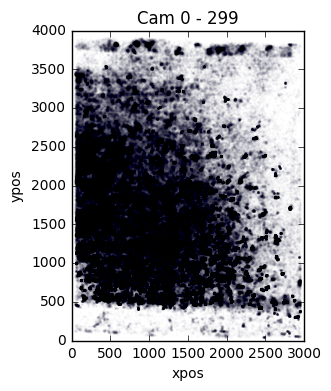

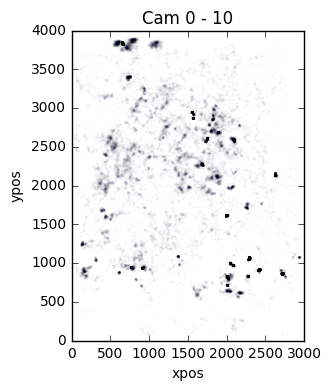

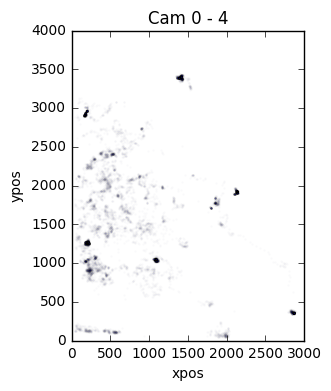

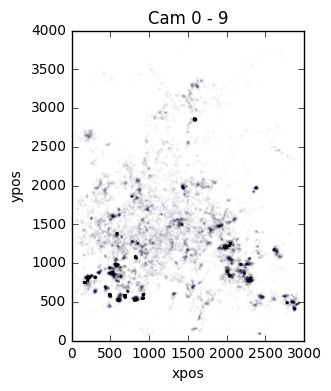

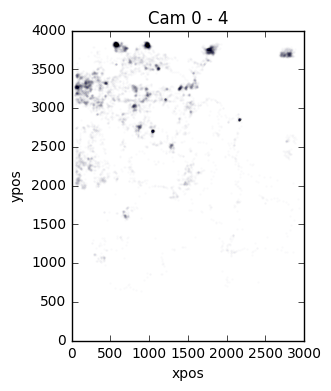

...

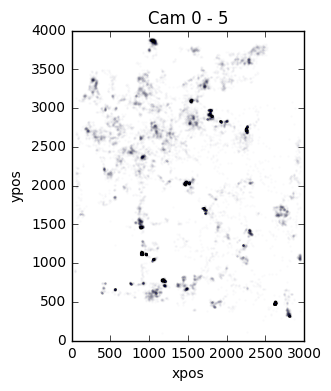

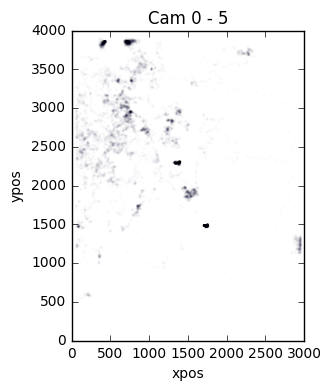

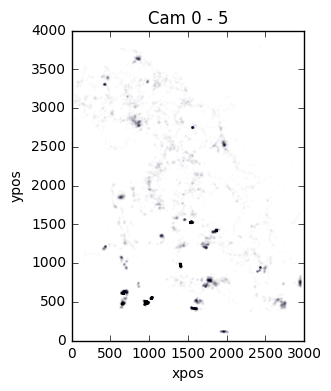

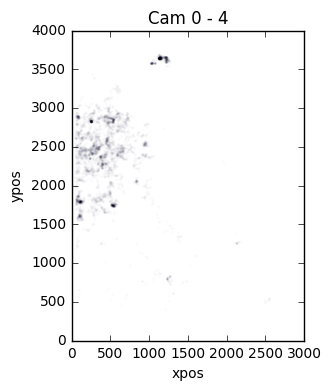

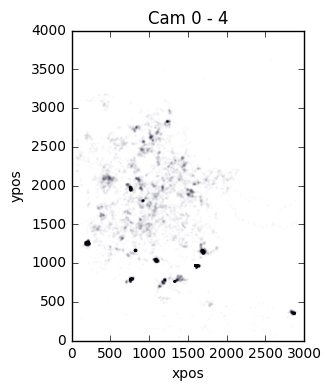

In [23]:
for e,item in enumerate(liste):
    com = liste[e]

    comL = []
    for i in com:
        comL.append(int(i))
    
    if len(comL) > 3:
        print(len(comL))
        df_com = df.loc[df['id'].isin(comL)]
        df_com.plot.scatter(x='xpos', y='ypos', title="Cam 0 - {}".format(len(comL)), s=1,xlim=(0,3000),ylim=(0,4000), alpha=0.01)
        plt.axes().set_aspect('equal')

In [49]:
ll = []
for e,item in enumerate(liste):
    l = [int(x) for x in list(item)]
    if len(l)>4:
        ll.append(l)

In [51]:
len(ll)

4

In [69]:
len(ll[2])

9

In [73]:
len(ll[3])

5

In [71]:
len(set(ll[2])-set(ll[3]))

7